In [1]:
# Importing gc module 
import gc 
  
# Returns the number of 
# objects it has collected 
# and deallocated 
collected = gc.collect() 
  
# Prints Garbage collector  
# as 0 object 
print("Garbage collector: collected", 
          "%d objects." % collected) 

Garbage collector: collected 38 objects.


In [2]:
mu_reader[(mu_reader['code'] ==-1)].reset_index()['data']

NameError: name 'mu_reader' is not defined

In [3]:
import scipy.io as sio
import pandas as pd
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import mne

In [4]:
mu_reader = pd.read_csv('MW.txt' ,sep= '\t', names = ['id', 'event', 'device', 'channel', 'code', 'size', 'data'])


In [5]:
df = mu_reader[(mu_reader['size'] >=951)].reset_index()

In [6]:
df

,index,id,event,device,channel,code,size,data
0,0,0,0,MW,FP1,0,1017,"38,48,51,44,48,56,56,41,20,-3,-9,-1,6,5,6,17,2..."
1,2,2,2,MW,FP1,4,1017,"19,10,-2,-9,-5,3,8,7,8,2,-10,-21,-22,-27,-30,-..."
2,3,3,3,MW,FP1,1,1017,"17,29,36,26,21,17,17,13,17,21,25,26,20,5,-5,-1..."
3,4,4,4,MW,FP1,8,952,"77,74,69,70,76,75,76,75,67,66,76,93,98,82,55,3..."
4,5,5,5,MW,FP1,4,1015,"60,59,59,55,36,18,12,20,23,6,-10,-11,-6,-5,-7,..."
5,6,6,6,MW,FP1,5,952,"-68,-65,-55,-52,-60,-67,-58,-46,-28,-19,-19,-2..."
6,7,7,7,MW,FP1,4,1015,"75,69,53,35,24,27,41,53,51,32,18,4,-4,-1,10,22..."
7,9,9,9,MW,FP1,7,952,"25,24,2,-19,-11,2,1,-4,-12,-18,-8,5,11,9,4,0,1..."
8,10,10,10,MW,FP1,4,953,"7,23,41,45,40,41,52,59,73,92,100,98,90,82,75,7..."
9,11,11,11,MW,FP1,4,1017,"7,8,22,25,26,34,32,26,33,50,56,42,22,17,24,27,..."


In [7]:
type(df.windows_per_row[0][1][0])

AttributeError: 'DataFrame' object has no attribute 'windows_per_row'

In [8]:
def windowing(large_list,window_size,step,num_of_w):
    current_start = 0
    windows=[]
    for _ in range(num_of_w):
        t = np.array(large_list[current_start:current_start+window_size],dtype=float)
        windows.append(t)
        current_start+=step
        if(current_start>len(t)):
            break

    return windows

In [9]:
df.data[0]

'38,48,51,44,48,56,56,41,20,-3,-9,-1,6,5,6,17,24,38,56,57,52,52,48,37,39,51,51,40,37,34,27,25,23,21,25,37,43,45,53,57,60,71,73,67,58,51,40,40,53,72,88,89,88,92,88,81,92,117,124,119,123,140,144,140,147,150,154,152,140,131,122,122,133,148,162,169,171,162,146,135,139,154,162,154,145,150,164,166,156,140,134,150,168,156,123,107,112,107,103,103,109,128,136,130,115,96,86,100,124,131,100,64,56,76,105,128,118,93,66,48,44,48,53,53,48,33,33,41,56,70,72,69,69,86,96,80,67,67,69,60,53,52,53,54,54,54,61,70,68,68,71,72,69,70,77,76,66,60,71,68,48,19,19,50,67,58,49,39,34,42,67,80,70,59,55,38,24,37,59,70,54,26,16,11,19,33,41,41,34,27,25,34,32,5,-12,-1,29,41,27,9,4,7,8,-3,-11,-9,-2,-6,-22,-35,-34,-17,-7,-12,-12,2,10,4,5,10,18,16,12,24,26,21,20,20,25,28,25,21,10,-11,-37,-42,-34,-13,5,16,10,-2,-21,-34,-25,-4,4,-9,-29,-40,-35,-22,-14,-8,-2,0,-11,-22,-25,-38,-53,-54,-52,-52,-49,-38,-38,-41,-41,-37,-35,-36,-30,-29,-44,-52,-37,-17,-10,-23,-37,-35,-20,-6,2,4,7,19,22,21,21,9,-3,0,1,-4,-10,-11,-5,-2,2,10,18,18,11,

In [10]:
windows_per_row = []
for row in df.iterrows():
    windows_per_row.append(windowing(row[1]['data'].split(','),512,51,8))

df['windows_per_row'] = (windows_per_row)

In [11]:
names = []
for i in range(8):
    names.append('window'+str(i))

df2 = pd.DataFrame(df['windows_per_row'])
df2[names] = pd.DataFrame(df2['windows_per_row'].values.tolist(), index= df2.index)

In [12]:
type(df2.window0[0][0])

numpy.float64

In [13]:
df_w = pd.concat([df,df2.drop(['windows_per_row'],axis=1)],axis=1)

In [14]:
type(df_w.window0[0][0])

numpy.float64

In [15]:
def transform(signal):
    signal = [float(x) for x in signal]
    a=np.abs(np.fft.fft(signal))/512
    return np.array(a[:int(len(signal)/2)],dtype=float)

In [16]:

df_w["data_list"] = df_w["data"].str.split(",")
df_w["data_list"] = df_w["data_list"].apply(lambda x : np.array(x,dtype=float))

In [17]:
type(df_w["data_list"][0])

numpy.ndarray

In [18]:
for col in names:
    df_w[col+'_fft'] = np.NaN
    df_w[col+'_fft'] = df_w[col].apply(transform)
    print('Done')
df_w['data_fft']=df_w['data_list'].apply(transform)

Done
Done
Done
Done
Done
Done
Done
Done


In [19]:
df_w.head(5)

,index,id,event,device,channel,code,size,data,windows_per_row,window0,...,data_list,window0_fft,window1_fft,window2_fft,window3_fft,window4_fft,window5_fft,window6_fft,window7_fft,data_fft
0,0,0,0,MW,FP1,0,1017,"38,48,51,44,48,56,56,41,20,-3,-9,-1,6,5,6,17,2...","[[38.0, 48.0, 51.0, 44.0, 48.0, 56.0, 56.0, 41...","[38.0, 48.0, 51.0, 44.0, 48.0, 56.0, 56.0, 41....",...,"[38.0, 48.0, 51.0, 44.0, 48.0, 56.0, 56.0, 41....","[32.10546875, 18.034511369595258, 24.285595492...","[24.03515625, 12.924792071784086, 28.324419710...","[14.53125, 6.320855436052341, 25.0534688653796...","[15.208984375, 6.870155019198535, 25.755465230...","[18.994140625, 10.569445178129715, 27.22622586...","[25.146484375, 15.57195861820112, 23.109710006...","[29.96875, 18.62488098991091, 18.6289683086374...","[37.54296875, 21.195027804246397, 19.080555737...","[77.560546875, 30.959728765279692, 17.20104252..."
1,2,2,2,MW,FP1,4,1017,"19,10,-2,-9,-5,3,8,7,8,2,-10,-21,-22,-27,-30,-...","[[19.0, 10.0, -2.0, -9.0, -5.0, 3.0, 8.0, 7.0,...","[19.0, 10.0, -2.0, -9.0, -5.0, 3.0, 8.0, 7.0, ...",...,"[19.0, 10.0, -2.0, -9.0, -5.0, 3.0, 8.0, 7.0, ...","[41.796875, 11.88148946158843, 16.557818756390...","[46.5546875, 8.165021496323813, 12.27839028715...","[42.89453125, 11.905317834825338, 11.897851400...","[39.75390625, 14.820772327745198, 10.019154441...","[36.939453125, 16.88716947676175, 7.1870282626...","[35.81640625, 17.301200208899857, 6.7935897090...","[39.978515625, 18.588134220117404, 4.295179095...","[37.474609375, 16.073236589851508, 6.244437986...","[71.142578125, 12.261514750899833, 18.04348147..."
2,3,3,3,MW,FP1,1,1017,"17,29,36,26,21,17,17,13,17,21,25,26,20,5,-5,-1...","[[17.0, 29.0, 36.0, 26.0, 21.0, 17.0, 17.0, 13...","[17.0, 29.0, 36.0, 26.0, 21.0, 17.0, 17.0, 13....",...,"[17.0, 29.0, 36.0, 26.0, 21.0, 17.0, 17.0, 13....","[29.083984375, 14.154713783843158, 12.66769232...","[30.630859375, 13.809801017514552, 11.80691220...","[35.609375, 16.41324215803021, 7.3691572324354...","[34.345703125, 14.902032119320786, 4.716296535...","[27.8671875, 8.905062881140045, 4.773323546909...","[27.095703125, 9.518513406801729, 3.3615092217...","[25.63671875, 10.175311359735016, 2.5028950311...","[29.94921875, 6.636039002924554, 3.16754647086...","[63.81640624999999, 3.1568762606056286, 15.256..."
3,4,4,4,MW,FP1,8,952,"77,74,69,70,76,75,76,75,67,66,76,93,98,82,55,3...","[[77.0, 74.0, 69.0, 70.0, 76.0, 75.0, 76.0, 75...","[77.0, 74.0, 69.0, 70.0, 76.0, 75.0, 76.0, 75....",...,"[77.0, 74.0, 69.0, 70.0, 76.0, 75.0, 76.0, 75....","[46.98046875, 7.207521486899412, 7.62701745133...","[46.18359375, 8.024934539606233, 8.38392209804...","[47.4296875, 6.803794059107725, 7.153484600516...","[40.91796875, 11.883187872397835, 9.9393716377...","[39.51171875, 12.394426048948407, 8.9425432835...","[38.498046875, 12.395704064415463, 7.894921344...","[33.107421875, 10.490749748076302, 8.065105597...","[23.63671875, 8.74419671033256, 16.97650429950...","[61.23828125, 23.11649324697801, 1.59770636174..."
4,5,5,5,MW,FP1,4,1015,"60,59,59,55,36,18,12,20,23,6,-10,-11,-6,-5,-7,...","[[60.0, 59.0, 59.0, 55.0, 36.0, 18.0, 12.0, 20...","[60.0, 59.0, 59.0, 55.0, 36.0, 18.0, 12.0, 20....",...,"[60.0, 59.0, 59.0, 55.0, 36.0, 18.0, 12.0, 20....","[32.013671875, 22.50204184582383, 6.5470267224...","[36.9296875, 21.059651342877824, 7.43495767822...","[41.501953125, 19.230206196454585, 11.57548026...","[45.333984375, 16.04796001250125, 13.201588422...","[50.31640625, 11.171751734040212, 11.016090618...","[50.912109375, 11.016512961003876, 10.68228224...","[52.951171875, 10.027667821111075, 9.164026242...","[47.560546875, 8.490656470639498, 4.6765147867...","[68.80859375, 25.37241362686529, 20.7328563403..."


In [20]:
df_w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60641 entries, 0 to 60640
Data columns (total 27 columns):
index              60641 non-null int64
id                 60641 non-null int64
event              60641 non-null int64
device             60641 non-null object
channel            60641 non-null object
code               60641 non-null int64
size               60641 non-null int64
data               60641 non-null object
windows_per_row    60641 non-null object
window0            60641 non-null object
window1            60641 non-null object
window2            60641 non-null object
window3            60641 non-null object
window4            60641 non-null object
window5            60641 non-null object
window6            60641 non-null object
window7            60641 non-null object
data_list          60641 non-null object
window0_fft        60641 non-null object
window1_fft        60641 non-null object
window2_fft        60641 non-null object
window3_fft        60641 non-null o

In [21]:
# for x in [ 'window0', 'window1', 'window2', 'window3',
#        'window4', 'window5', 'window6', 'window7', 'data_list']:
#     df_w[x] = np.array(df_w[x],dtype=float)

In [22]:
# df_w['window0'].astype(float)

In [23]:
for x in [ 'window0', 'window1', 'window2', 'window3',
       'window4', 'window5', 'window6', 'window7', 'data_list', 'window0_fft',
       'window1_fft', 'window2_fft', 'window3_fft', 'window4_fft',
       'window5_fft', 'window6_fft', 'window7_fft', 'data_fft']:
    print(type(df_w[x][0][0]))

<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>


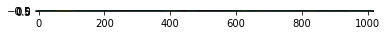

In [65]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.imshow(np.asarray([df_w['data_list'][0]],dtype=float));

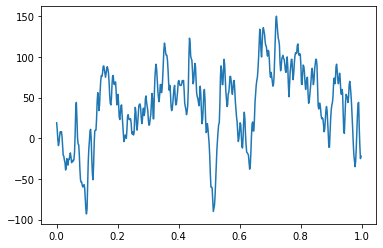

In [66]:
t1=np.arange(0,512)/512
EEG2=np.array(df_w['window0'][1],dtype=float)
plt.plot(t1,EEG2)

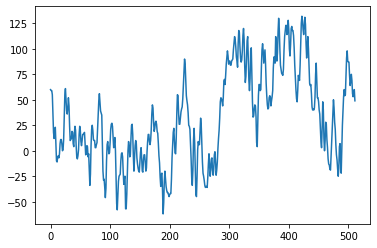

In [67]:
# t1=np.arange(0,512)/512
EEG2=df_w['window0'][4]
plt.plot(EEG2)

In [68]:
# t1=np.arange(0,512)/512
# EEG2=df_w['window0'][0]
S = np.array(df_w['window0'][0],dtype=float)
# plt.plot(EEG2)
# plt.xlim(0,80)

In [69]:
S.shape

(512,)

In [70]:
a.shape

NameError: name 'a' is not defined

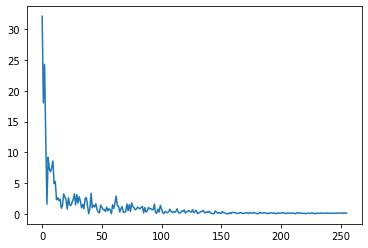

In [71]:
a=np.abs(np.fft.fft(S))/512
f=np.fft.fftfreq(len(S))*512 
plt.plot(f[:256],a[:256])
#plt.xlim(0,80)
# plt.xticks(range(12));)


In [ ]:
plt.figure(figsize=(12,8))
plt.imshow(np.log(f_feat_timesseries.values.T[::-1]), cmap='hot',aspect='auto')

In [72]:
EEG2.shape

(512,)

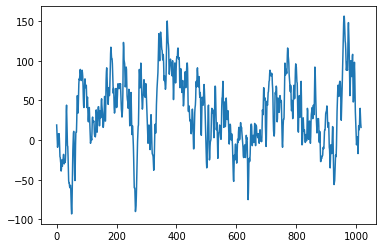

In [73]:
# t1=np.arange(0,512)/512
# EEG2=df_w['window0'][0]
EEG2 = np.array(df_w['data'][1].split(','),dtype=float)
plt.plot(EEG2)

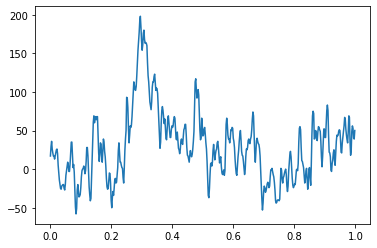

In [74]:
t1=np.arange(0,512)/512
EEG2=df_w['window0'][2]
plt.plot(t1,EEG2)

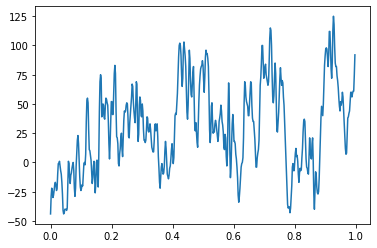

In [75]:
t1=np.arange(0,512)/512
EEG2=df_w['window7'][2]
plt.plot(t1,EEG2)

In [76]:


f, t, Sxx = signal.spectrogram(np.asarray(flattened_list,dtype=float) , 512)
plt.pcolormesh(t, f, Sxx)
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0,70)
plt.show()

NameError: name 'flattened_list' is not defined

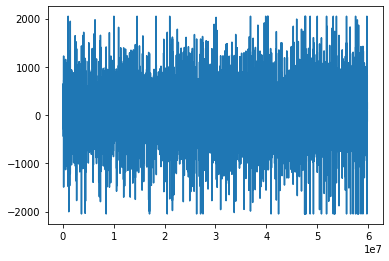

In [57]:
plt.plot(np.asarray(flattened_list,dtype=float))

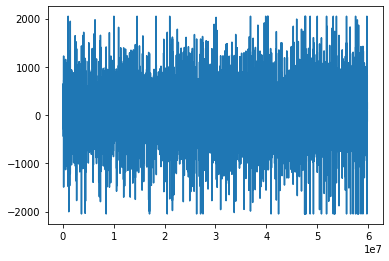

In [59]:
plt.plot(np.asarray(flattened_list,dtype=float))


In [53]:
list_of_lists = (df_w[df_w['code']==c].sample(500)['data_list'].values.tolist())

In [51]:
list_of_lists = (df_w[df_w['code']==0]['data_list'].values.tolist())
flattened_list = [y for x in list_of_lists for y in x]

In [77]:
c = -1
# 4700
for i in range(11):
    list_of_lists = (df_w[df_w['code']==c].sample(500)['data_list'].values.tolist())
    flattened_list = [y for x in list_of_lists for y in x]
    f = open(str(c)+'.csv','w')
    f.write(','.join(np.asarray(flattened_list)))
    f.close()
    c+=1

TypeError: sequence item 0: expected str instance, numpy.float64 found

In [80]:
(df_w[df_w['code']==0].sample(500)['data_list'])

24478    [26, 57, 115, 155, 117, 34, -2, 13, 51, 80, 81...
39382    [33, 25, 28, 40, 53, 48, 37, 45, 67, 69, 55, 5...
38751    [18, 4, 11, 25, 33, 37, 37, 28, 17, 10, 27, 52...
44220    [16, 4, 6, 19, 23, 21, 19, 24, 36, 52, 66, 66,...
43554    [51, 41, 38, 54, 64, 50, 40, 39, 43, 41, 35, 3...
13923    [2, -6, -2, 8, 20, 34, 44, 40, 21, 12, 19, 26,...
40846    [44, 59, 53, 43, 43, 44, 49, 57, 53, 24, 2, 5,...
26554    [55, 61, 54, 39, 28, 32, 34, 33, 25, 11, -4, -...
39227    [115, 132, 144, 151, 162, 180, 202, 211, 218, ...
38612    [54, 49, 40, 51, 57, 64, 75, 87, 83, 66, 55, 5...
21347    [132, 123, 91, 72, 77, 101, 128, 137, 123, 88,...
39133    [145, 129, 112, 115, 133, 145, 137, 130, 138, ...
617      [4, 3, 7, 6, 0, -3, -6, -9, -17, -21, -13, 3, ...
40442    [160, 169, 166, 151, 122, 109, 107, 103, 102, ...
37381    [9, 11, -2, -21, -38, -53, -68, -73, -68, -55,...
570      [38, 35, 32, 23, 17, 10, 4, -4, -12, -5, 21, 5...
46430    [38, 44, 52, 56, 65, 66, 56, 51, 49, 48, 42, 4.

In [35]:
dfs = []
c = -1
# 4700
for i in range(11):
    temp =[]
    for r in range(8):
        tempdf = df_w[df_w['code']==c].sample(500)
        tempdf['window'] = tempdf[['window'+str(r)]]
        tempdf['label'] = c
        temp.append(tempdf[['window','label']])
        print ('label '+str(c)+' window '+str(r), end="\r") 
    c+=1
    dfs.append(pd.concat(temp,ignore_index=True))
dfs = pd.concat(dfs,ignore_index=True)
dfs['window'] = dfs['window'].apply(lambda x: np.array(x,dtype=float))


In [36]:
dfs

,window,label
0,"[24.0, 36.0, 68.0, 93.0, 88.0, 65.0, 52.0, 50....",-1
1,"[68.0, 66.0, 54.0, 49.0, 35.0, 20.0, 26.0, 35....",-1
2,"[37.0, 42.0, 49.0, 43.0, 21.0, 5.0, 5.0, 0.0, ...",-1
3,"[178.0, 149.0, 151.0, 181.0, 180.0, 160.0, 149...",-1
4,"[38.0, 29.0, 72.0, 120.0, 145.0, 139.0, 121.0,...",-1
5,"[86.0, 41.0, -20.0, -69.0, -120.0, -138.0, -11...",-1
6,"[86.0, 112.0, 131.0, 106.0, 43.0, 36.0, 105.0,...",-1
7,"[-105.0, -101.0, -115.0, -124.0, -116.0, -99.0...",-1
8,"[60.0, 29.0, 22.0, 57.0, 92.0, 112.0, 107.0, 9...",-1
9,"[128.0, 130.0, 124.0, 108.0, 103.0, 120.0, 140...",-1


In [37]:
signal= dfs['window'].apply(lambda x: x.tolist())
dff = pd.DataFrame(signal.tolist())

In [38]:
dff['label']=dfs['label']

In [39]:
dff

,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,label
0,24.0,36.0,68.0,93.0,88.0,65.0,52.0,50.0,54.0,71.0,...,73.0,77.0,97.0,92.0,81.0,83.0,84.0,89.0,99.0,-1
1,68.0,66.0,54.0,49.0,35.0,20.0,26.0,35.0,32.0,25.0,...,-39.0,-38.0,-12.0,28.0,76.0,88.0,69.0,56.0,59.0,-1
2,37.0,42.0,49.0,43.0,21.0,5.0,5.0,0.0,-9.0,-12.0,...,39.0,33.0,0.0,-11.0,-6.0,1.0,18.0,18.0,0.0,-1
3,178.0,149.0,151.0,181.0,180.0,160.0,149.0,150.0,147.0,141.0,...,488.0,459.0,394.0,329.0,284.0,263.0,218.0,140.0,83.0,-1
4,38.0,29.0,72.0,120.0,145.0,139.0,121.0,98.0,80.0,73.0,...,48.0,42.0,27.0,10.0,-5.0,9.0,35.0,22.0,0.0,-1
5,86.0,41.0,-20.0,-69.0,-120.0,-138.0,-110.0,-65.0,-23.0,-2.0,...,104.0,115.0,91.0,76.0,52.0,64.0,120.0,152.0,150.0,-1
6,86.0,112.0,131.0,106.0,43.0,36.0,105.0,164.0,145.0,98.0,...,-259.0,-254.0,-266.0,-267.0,-279.0,-297.0,-279.0,-282.0,-266.0,-1
7,-105.0,-101.0,-115.0,-124.0,-116.0,-99.0,-74.0,-52.0,-51.0,-70.0,...,6.0,6.0,16.0,20.0,8.0,-7.0,-17.0,-7.0,8.0,-1
8,60.0,29.0,22.0,57.0,92.0,112.0,107.0,90.0,61.0,20.0,...,7.0,-2.0,-8.0,-18.0,-36.0,-55.0,-30.0,5.0,13.0,-1
9,128.0,130.0,124.0,108.0,103.0,120.0,140.0,152.0,153.0,154.0,...,89.0,93.0,89.0,77.0,88.0,89.0,85.0,73.0,61.0,-1


In [40]:
dff.loc[:, dff.columns != 'label']

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
0,24.0,36.0,68.0,93.0,88.0,65.0,52.0,50.0,54.0,71.0,...,101.0,73.0,77.0,97.0,92.0,81.0,83.0,84.0,89.0,99.0
1,68.0,66.0,54.0,49.0,35.0,20.0,26.0,35.0,32.0,25.0,...,-2.0,-39.0,-38.0,-12.0,28.0,76.0,88.0,69.0,56.0,59.0
2,37.0,42.0,49.0,43.0,21.0,5.0,5.0,0.0,-9.0,-12.0,...,17.0,39.0,33.0,0.0,-11.0,-6.0,1.0,18.0,18.0,0.0
3,178.0,149.0,151.0,181.0,180.0,160.0,149.0,150.0,147.0,141.0,...,489.0,488.0,459.0,394.0,329.0,284.0,263.0,218.0,140.0,83.0
4,38.0,29.0,72.0,120.0,145.0,139.0,121.0,98.0,80.0,73.0,...,58.0,48.0,42.0,27.0,10.0,-5.0,9.0,35.0,22.0,0.0
5,86.0,41.0,-20.0,-69.0,-120.0,-138.0,-110.0,-65.0,-23.0,-2.0,...,32.0,104.0,115.0,91.0,76.0,52.0,64.0,120.0,152.0,150.0
6,86.0,112.0,131.0,106.0,43.0,36.0,105.0,164.0,145.0,98.0,...,-295.0,-259.0,-254.0,-266.0,-267.0,-279.0,-297.0,-279.0,-282.0,-266.0
7,-105.0,-101.0,-115.0,-124.0,-116.0,-99.0,-74.0,-52.0,-51.0,-70.0,...,11.0,6.0,6.0,16.0,20.0,8.0,-7.0,-17.0,-7.0,8.0
8,60.0,29.0,22.0,57.0,92.0,112.0,107.0,90.0,61.0,20.0,...,3.0,7.0,-2.0,-8.0,-18.0,-36.0,-55.0,-30.0,5.0,13.0
9,128.0,130.0,124.0,108.0,103.0,120.0,140.0,152.0,153.0,154.0,...,88.0,89.0,93.0,89.0,77.0,88.0,89.0,85.0,73.0,61.0


In [41]:
dff.head(5)

,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,label
0,24.0,36.0,68.0,93.0,88.0,65.0,52.0,50.0,54.0,71.0,...,73.0,77.0,97.0,92.0,81.0,83.0,84.0,89.0,99.0,-1
1,68.0,66.0,54.0,49.0,35.0,20.0,26.0,35.0,32.0,25.0,...,-39.0,-38.0,-12.0,28.0,76.0,88.0,69.0,56.0,59.0,-1
2,37.0,42.0,49.0,43.0,21.0,5.0,5.0,0.0,-9.0,-12.0,...,39.0,33.0,0.0,-11.0,-6.0,1.0,18.0,18.0,0.0,-1
3,178.0,149.0,151.0,181.0,180.0,160.0,149.0,150.0,147.0,141.0,...,488.0,459.0,394.0,329.0,284.0,263.0,218.0,140.0,83.0,-1
4,38.0,29.0,72.0,120.0,145.0,139.0,121.0,98.0,80.0,73.0,...,48.0,42.0,27.0,10.0,-5.0,9.0,35.0,22.0,0.0,-1


In [42]:
from sklearn.model_selection import train_test_split
X_train, test_X, y_train, test_y = train_test_split(dff.loc[:, dff.columns != 'label'],dff['label'], test_size=0.33, random_state=42)

In [43]:
min(list(map(lambda x:len(x),dfs['window'])))

512

In [44]:
t=np.array([X_train]).shape
tt = np.array([X_train])

ValueError: cannot copy sequence with size 29480 to array axis with dimension 512

In [45]:
X_train.col

AttributeError: 'DataFrame' object has no attribute 'col'

In [46]:
npX_train.reshape(-1,1)

NameError: name 'npX_train' is not defined

In [47]:
lstm_input = X_train.values.reshape(29480, 512, -1)

In [48]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 8872246414505446449
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 6624624411780409633
physical_device_desc: "device: XLA_CPU device"
]


In [49]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.layers import Embedding
from keras.layers import LSTM


# code for building an LSTM with 100 neurons and dropout. Runs for 50 epochs

model = Sequential()
model.add(LSTM(100, return_sequences=False, input_shape=lstm_input.shape[1:]))
model.add(Dropout(0.5))
#model.add(LSTM(100)) dramatically worse results
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

model.fit(lstm_input, y_train.values, batch_size=16, epochs=50)

#X_train.values.reshape(29480,1,1)

Using TensorFlow backend.


Epoch 1/50
  992/29480 [>.............................] - ETA: 5:02 - loss: -25.4680 - accuracy: 0.1058

KeyboardInterrupt: 

In [ ]:
score = model.evaluate(X_test, y_test, batch_size=16)

In [135]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.layers import Embedding
from keras.layers import LSTM

Using TensorFlow backend.


In [134]:
type(dfs['window'][0][0])


numpy.float64

In [127]:
dfs.drop_duplicates(subset ="window") 

,window,label
0,"(26, 22, 25, 34, 41, 16, -22, -40, -23, -5, -3...",-1
1,"(-186, -237, -308, -382, -435, -471, -516, -55...",-1
2,"(326, 354, 329, 292, 289, 258, 210, 192, 196, ...",-1
3,"(-22, -12, 1, 2, -20, -56, -56, -20, -3, -13, ...",-1
4,"(106, 102, 83, 53, 56, 92, 128, 130, 115, 115,...",-1
5,"(24, 13, 3, -5, 4, 18, 20, 6, -10, -28, -41, -...",-1
6,"(20, 40, 85, 118, 132, 114, 76, 55, 68, 112, 1...",-1
7,"(76, 61, 39, 28, 42, 67, 76, 60, 38, 34, 38, 5...",-1
8,"(43, 64, 74, 81, 73, 52, 38, 43, 48, 25, -1, -...",-1
9,"(-11, -33, -36, -33, -25, -24, -37, -45, -56, ...",-1


In [63]:
list_of_lists = (df_w[df_w['code']==c].sample(500)['data_list'].values.tolist())
flattened_list = [y for x in list_of_lists for y in x]

[['70',
  '51',
  '32',
  '33',
  '49',
  '54',
  '54',
  '43',
  '27',
  '25',
  '23',
  '24',
  '27',
  '32',
  '28',
  '24',
  '24',
  '27',
  '24',
  '9',
  '0',
  '5',
  '21',
  '33',
  '19',
  '-1',
  '8',
  '26',
  '33',
  '20',
  '2',
  '-8',
  '-7',
  '1',
  '8',
  '6',
  '0',
  '-1',
  '5',
  '8',
  '16',
  '26',
  '17',
  '5',
  '12',
  '27',
  '35',
  '36',
  '27',
  '6',
  '-9',
  '-3',
  '10',
  '9',
  '1',
  '7',
  '27',
  '40',
  '43',
  '39',
  '32',
  '32',
  '32',
  '29',
  '36',
  '36',
  '34',
  '38',
  '41',
  '41',
  '38',
  '36',
  '39',
  '48',
  '54',
  '51',
  '40',
  '43',
  '50',
  '38',
  '23',
  '16',
  '11',
  '10',
  '11',
  '16',
  '16',
  '17',
  '17',
  '10',
  '6',
  '10',
  '12',
  '21',
  '24',
  '21',
  '20',
  '27',
  '45',
  '51',
  '42',
  '41',
  '50',
  '50',
  '53',
  '58',
  '56',
  '53',
  '53',
  '58',
  '71',
  '71',
  '50',
  '26',
  '37',
  '55',
  '49',
  '35',
  '37',
  '41',
  '51',
  '73',
  '91',
  '85',
  '64',
  '58',
  '71',
 

['38',
 '48',
 '51',
 '44',
 '48',
 '56',
 '56',
 '41',
 '20',
 '-3',
 '-9',
 '-1',
 '6',
 '5',
 '6',
 '17',
 '24',
 '38',
 '56',
 '57',
 '52',
 '52',
 '48',
 '37',
 '39',
 '51',
 '51',
 '40',
 '37',
 '34',
 '27',
 '25',
 '23',
 '21',
 '25',
 '37',
 '43',
 '45',
 '53',
 '57',
 '60',
 '71',
 '73',
 '67',
 '58',
 '51',
 '40',
 '40',
 '53',
 '72',
 '88',
 '89',
 '88',
 '92',
 '88',
 '81',
 '92',
 '117',
 '124',
 '119',
 '123',
 '140',
 '144',
 '140',
 '147',
 '150',
 '154',
 '152',
 '140',
 '131',
 '122',
 '122',
 '133',
 '148',
 '162',
 '169',
 '171',
 '162',
 '146',
 '135',
 '139',
 '154',
 '162',
 '154',
 '145',
 '150',
 '164',
 '166',
 '156',
 '140',
 '134',
 '150',
 '168',
 '156',
 '123',
 '107',
 '112',
 '107',
 '103',
 '103',
 '109',
 '128',
 '136',
 '130',
 '115',
 '96',
 '86',
 '100',
 '124',
 '131',
 '100',
 '64',
 '56',
 '76',
 '105',
 '128',
 '118',
 '93',
 '66',
 '48',
 '44',
 '48',
 '53',
 '53',
 '48',
 '33',
 '33',
 '41',
 '56',
 '70',
 '72',
 '69',
 '69',
 '86',
 '96',
 '8

In [ ]:
df_w.equals(teste)

In [56]:
print(','.join(df['windows_per_row'][0][0]))

38,48,51,44,48,56,56,41,20,-3,-9,-1,6,5,6,17,24,38,56,57,52,52,48,37,39,51,51,40,37,34,27,25,23,21,25,37,43,45,53,57,60,71,73,67,58,51,40,40,53,72,88,89,88,92,88,81,92,117,124,119,123,140,144,140,147,150,154,152,140,131,122,122,133,148,162,169,171,162,146,135,139,154,162,154,145,150,164,166,156,140,134,150,168,156,123,107,112,107,103,103,109,128,136,130,115,96,86,100,124,131,100,64,56,76,105,128,118,93,66,48,44,48,53,53,48,33,33,41,56,70,72,69,69,86,96,80,67,67,69,60,53,52,53,54,54,54,61,70,68,68,71,72,69,70,77,76,66,60,71,68,48,19,19,50,67,58,49,39,34,42,67,80,70,59,55,38,24,37,59,70,54,26,16,11,19,33,41,41,34,27,25,34,32,5,-12,-1,29,41,27,9,4,7,8,-3,-11,-9,-2,-6,-22,-35,-34,-17,-7,-12,-12,2,10,4,5,10,18,16,12,24,26,21,20,20,25,28,25,21,10,-11,-37,-42,-34,-13,5,16,10,-2,-21,-34,-25,-4,4,-9,-29,-40,-35,-22,-14,-8,-2,0,-11,-22,-25,-38,-53,-54,-52,-52,-49,-38,-38,-41,-41,-37,-35,-36,-30,-29,-44,-52,-37,-17,-10,-23,-37,-35,-20,-6,2,4,7,19,22,21,21,9,-3,0,1,-4,-10,-11,-5,-2,2,10,18,18,11,1

In [54]:
type(df['windows_per_row'][0])

list

In [118]:
i = -1

for _ in range(11):
    print(i)
    temp = mu_reader[(mu_reader['code'] == i) & (mu_reader['size'] >=951)]
    print(temp['size'].value_counts())
    i+=1

-1
1024    12701
Name: size, dtype: int64
0
952     1470
953     1389
1015     895
1017     888
951      104
1016      72
1014      62
Name: size, dtype: int64
1
952     1498
953     1327
1017     905
1015     842
951      110
1016      93
1014      57
Name: size, dtype: int64
2
952     1410
953     1348
1015     873
1017     861
951      103
1016      87
1014      73
Name: size, dtype: int64
3
952     1450
953     1300
1015     889
1017     869
951      106
1016      63
1014      56
Name: size, dtype: int64
4
952     1396
953     1352
1017     885
1015     813
951      110
1016      86
1014      58
Name: size, dtype: int64
5
952     1476
953     1383
1017     903
1015     877
951      111
1016      98
1014      64
Name: size, dtype: int64
6
952     1411
953     1406
1017     878
1015     855
951      109
1016      80
1014      42
Name: size, dtype: int64
7
952     1469
953     1333
1017     902
1015     818
951       99
1016      87
1014      64
Name: size, dtype: int64
8
952     1442

In [5]:
# Create some dummy metadata
n_channels = 1
sampling_rate = 512
info = mne.create_info(n_channels, sampling_rate)
print(info)

<Info | 16 non-empty fields
    bads : list | 0 items
    ch_names : list | 0
    chs : list | 1 items (MISC: 1)
    comps : list | 0 items
    custom_ref_applied : bool | False
    dev_head_t : Transform | 3 items
    events : list | 0 items
    highpass : float | 0.0 Hz
    hpi_meas : list | 0 items
    hpi_results : list | 0 items
    lowpass : float | 256.0 Hz
    meas_date : NoneType | unspecified
    nchan : int | 1
    proc_history : list | 0 items
    projs : list | 0 items
    sfreq : float | 512.0 Hz
    acq_pars : NoneType
    acq_stim : NoneType
    ctf_head_t : NoneType
    description : NoneType
    dev_ctf_t : NoneType
    device_info : NoneType
    dig : NoneType
    experimenter : NoneType
    file_id : NoneType
    gantry_angle : NoneType
    helium_info : NoneType
    hpi_subsystem : NoneType
    kit_system_id : NoneType
    line_freq : NoneType
    meas_id : NoneType
    proj_id : NoneType
    proj_name : NoneType
    subject_info : NoneType
    utc_offset : NoneTyp

In [6]:
# Names for each channel
channel_names = ['FP1']

# The type (mag, grad, eeg, eog, misc, ...) of each channel
channel_types = ['eeg']

# The sampling rate of the recording
sfreq = 512  # in Hertz

# The EEG channels use the standard naming strategy.
# By supplying the 'montage' parameter, approximate locations
# will be added for them
montage = 'standard_1005'

info

<Info | 16 non-empty fields
    bads : list | 0 items
    ch_names : list | 0
    chs : list | 1 items (MISC: 1)
    comps : list | 0 items
    custom_ref_applied : bool | False
    dev_head_t : Transform | 3 items
    events : list | 0 items
    highpass : float | 0.0 Hz
    hpi_meas : list | 0 items
    hpi_results : list | 0 items
    lowpass : float | 256.0 Hz
    meas_date : NoneType | unspecified
    nchan : int | 1
    proc_history : list | 0 items
    projs : list | 0 items
    sfreq : float | 512.0 Hz
    acq_pars : NoneType
    acq_stim : NoneType
    ctf_head_t : NoneType
    description : NoneType
    dev_ctf_t : NoneType
    device_info : NoneType
    dig : NoneType
    experimenter : NoneType
    file_id : NoneType
    gantry_angle : NoneType
    helium_info : NoneType
    hpi_subsystem : NoneType
    kit_system_id : NoneType
    line_freq : NoneType
    meas_id : NoneType
    proj_id : NoneType
    proj_name : NoneType
    subject_info : NoneType
    utc_offset : NoneTyp

In [7]:
# Initialize required fields
info = mne.create_info(channel_names, sfreq, channel_types, montage)

# Add some more information
info['description'] = 'My custom dataset'
info['bads'] = ['Pz']  # Names of bad channels

print(info)

ValueError: DigMontage is a only a subset of info. There are 1 channel positions not present it the DigMontage. The required channels are: {'FP1'}.
You can use `raise_if_subset=False` in `set_montage` to avoid this ValueError and get a DeprecationWarning instead.

In [46]:
# Generate some random data
# data = np.random.randn(5, 1000)
data = np.asarray(mu_reader['data'][324].split(','))
print((mu_reader['data'][0]))
data = data.astype(np.float)
data = np.array([data],float)
print(type(data))
# Initialize an info structure
info = mne.create_info(
    ch_names=['FP1'],
    ch_types=['eeg'],
    sfreq=512
)

custom_raw = mne.io.RawArray(data, info)
print(custom_raw)

38,48,51,44,48,56,56,41,20,-3,-9,-1,6,5,6,17,24,38,56,57,52,52,48,37,39,51,51,40,37,34,27,25,23,21,25,37,43,45,53,57,60,71,73,67,58,51,40,40,53,72,88,89,88,92,88,81,92,117,124,119,123,140,144,140,147,150,154,152,140,131,122,122,133,148,162,169,171,162,146,135,139,154,162,154,145,150,164,166,156,140,134,150,168,156,123,107,112,107,103,103,109,128,136,130,115,96,86,100,124,131,100,64,56,76,105,128,118,93,66,48,44,48,53,53,48,33,33,41,56,70,72,69,69,86,96,80,67,67,69,60,53,52,53,54,54,54,61,70,68,68,71,72,69,70,77,76,66,60,71,68,48,19,19,50,67,58,49,39,34,42,67,80,70,59,55,38,24,37,59,70,54,26,16,11,19,33,41,41,34,27,25,34,32,5,-12,-1,29,41,27,9,4,7,8,-3,-11,-9,-2,-6,-22,-35,-34,-17,-7,-12,-12,2,10,4,5,10,18,16,12,24,26,21,20,20,25,28,25,21,10,-11,-37,-42,-34,-13,5,16,10,-2,-21,-34,-25,-4,4,-9,-29,-40,-35,-22,-14,-8,-2,0,-11,-22,-25,-38,-53,-54,-52,-52,-49,-38,-38,-41,-41,-37,-35,-36,-30,-29,-44,-52,-37,-17,-10,-23,-37,-35,-20,-6,2,4,7,19,22,21,21,9,-3,0,1,-4,-10,-11,-5,-2,2,10,18,18,11,1

In [58]:
custom_raw.ch_names

['FP1']

In [80]:
temp = raw
raw = custom_raw 

In [75]:
type(raw)

mne.io.fiff.raw.Raw

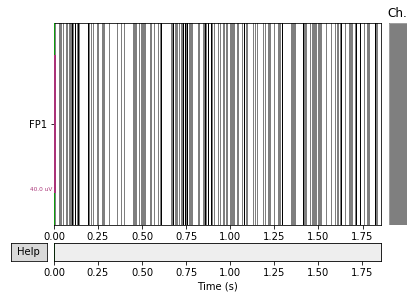

(array([[ 18.,  11.,   8.,  21.,  38.,  45.,  55.,  53.,  42.,  42.,  41.,
          42.,  48.,  58.,  93.,  90.,  16., -33.,  -1.,  44.,  42.,  11.,
         -13., -20.,  -1.,  13.,  20.,  35.,  50.,  64.,  74.,  71.,  54.,
          43.,  42.,  39.,  28.,  22.,  22.,  32.,  44.,  76., 100.,  70.,
          20.,  16.,  43.,  56.,  53.,  43.,  35.,  29.,  40.,  36.,  17.,
           5.,  19.,  49.,  65.,  55.,  37.,  20.,  33., 102., 122.,  97.,
          39.,   1.,  11.,  43.,  44.,  18.,   0.,  22.,  64.,  83.,  71.,
          45.,  49.,  65.,  68.,  61.,  58.,  50.,  53.,  57.,  60.,  60.,
          53.,  45.,  43.,  43.,  53.,  66.,  67.,  90., 102.,  68.,  22.,
          18.,  35.,  49.,  52.,  36.,   8.,   1.,  19.,  50.,  75.,  76.,
          60.,  50.,  41.,  35.,  23.,   8.,   0.,  -1.,  10.,  25.,  23.,
          24.,  28.,  32.,  28.,  24.,  53.,  71.,  33., -17., -26., -14.,
          -6., -11., -19., -10.,  -4., -17., -17.,   9.,  36.,  50.,  49.,
          27.,  18.,  26.

In [91]:
raw.plot()

raw[0, start:stop]

(1, 512)
(512,)


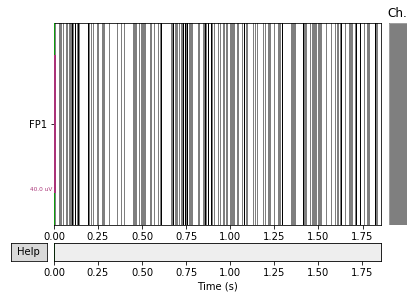

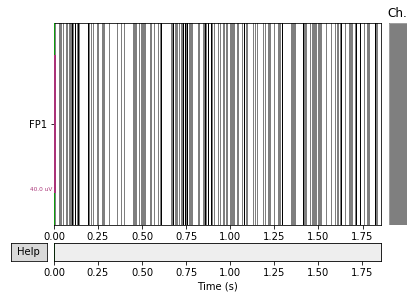

In [90]:
start, stop = raw.time_as_index([0, 1])  # 100 s to 115 s data segment
data, times = raw[:, start:stop]
print(data.shape)
print(times.shape)
data, times = raw[0:34454365:364563456, start:stop]  # access underlying data
raw.plot()

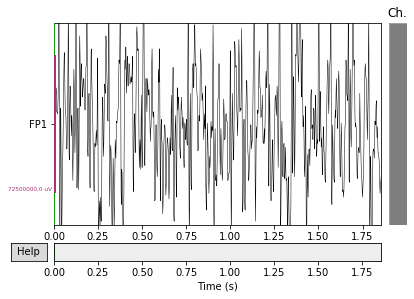

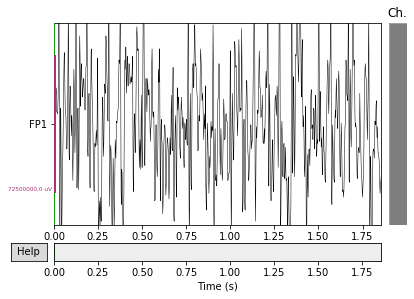

In [52]:
scalings = 'auto'  # Could also pass a dictionary with some value == 'auto'

custom_raw.plot(n_channels=1, scalings=scalings, title='Auto-scaled Data from arrays',
         show=True, block=True)

In [47]:
data.mean(0)

array([ 18.,  11.,   8.,  21.,  38.,  45.,  55.,  53.,  42.,  42.,  41.,
        42.,  48.,  58.,  93.,  90.,  16., -33.,  -1.,  44.,  42.,  11.,
       -13., -20.,  -1.,  13.,  20.,  35.,  50.,  64.,  74.,  71.,  54.,
        43.,  42.,  39.,  28.,  22.,  22.,  32.,  44.,  76., 100.,  70.,
        20.,  16.,  43.,  56.,  53.,  43.,  35.,  29.,  40.,  36.,  17.,
         5.,  19.,  49.,  65.,  55.,  37.,  20.,  33., 102., 122.,  97.,
        39.,   1.,  11.,  43.,  44.,  18.,   0.,  22.,  64.,  83.,  71.,
        45.,  49.,  65.,  68.,  61.,  58.,  50.,  53.,  57.,  60.,  60.,
        53.,  45.,  43.,  43.,  53.,  66.,  67.,  90., 102.,  68.,  22.,
        18.,  35.,  49.,  52.,  36.,   8.,   1.,  19.,  50.,  75.,  76.,
        60.,  50.,  41.,  35.,  23.,   8.,   0.,  -1.,  10.,  25.,  23.,
        24.,  28.,  32.,  28.,  24.,  53.,  71.,  33., -17., -26., -14.,
        -6., -11., -19., -10.,  -4., -17., -17.,   9.,  36.,  50.,  49.,
        27.,  18.,  26.,  44.,  57.,  56.,  52.,  6

In [48]:
data.shape



(1, 952)

hi
<Evoked  |  'Smiley faces' (average, N=1), [-0.099609, 1.7578] sec, 1 ch, ~14 kB>
Need more than one channel to make topography for eeg. Disabling interactivity.


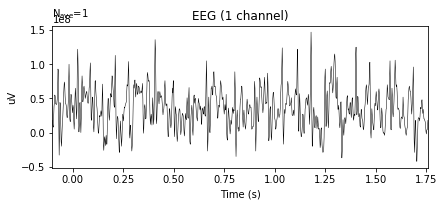

In [49]:
tmin = -0.1
# The averaged data
data_evoked = data.mean(0)
data_evoked=np.array([data_evoked],float)

# The number of epochs that were averaged
nave = data.shape[0]

# A comment to describe to evoked (usually the condition name)
comment = "Smiley faces"

# Create the Evoked object
evoked_array = mne.EvokedArray(data_evoked, info, tmin,
                               comment=comment, nave=nave)
print('hi')
print(evoked_array)
_ = evoked_array.plot(time_unit='s')

In [18]:
type(data_evoked)

numpy.ndarray

In [29]:
data_evoked.shape

(1, 1017)

In [20]:
data.shape

(1, 1017)

In [28]:
data_evoked=np.array([data_evoked],float)

Automatically created module for IPython interactive environment
Opening raw data file /home/khalid/mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif...
    Read a total of 3 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
Current compensation grade : 0
72 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
Created an SSP operator (subspace dimension = 3)
3 projection items activated
Loading data for 72 events and 1203 original time points ...
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 061']
    Rejecting  epoch based on EOG : ['EOG 06

<ipython-input-72-28d886c97911>:27: DeprecationWarning: spatial_colors defaults to False in 0.19 but will change to True in 0.20. Set it explicitly to avoid this warning.
  epochs.plot_psd(fmin=2, fmax=200)
<ipython-input-72-28d886c97911>:27: DeprecationWarning: average defaults to True in 0.19 but will change to False in 0.20. Set it explicitly to avoid this warning.
  epochs.plot_psd(fmin=2, fmax=200)


    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows


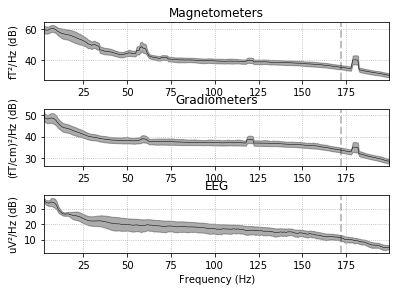

    Using multitaper spectrum estimation with 7 DPSS windows


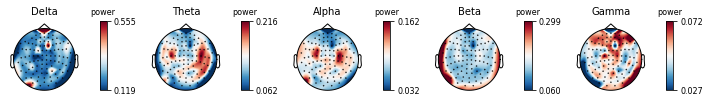

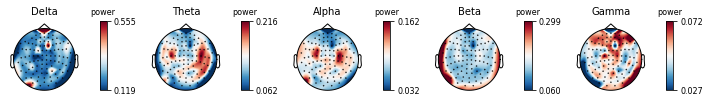

In [72]:
# Authors: Denis Engemann <denis.engemann@gmail.com>
#
# License: BSD (3-clause)

import mne
from mne import io
from mne.datasets import sample

print(__doc__)

data_path = sample.data_path()
raw_fname = data_path + '/MEG/sample/sample_audvis_raw.fif'
event_fname = data_path + '/MEG/sample/sample_audvis_raw-eve.fif'

# Setup for reading the raw data
raw = io.Raw(raw_fname)
events = mne.read_events(event_fname)

tmin, tmax, event_id = -1., 1., 1
raw.info['bads'] += ['MEG 2443']  # bads

epochs = mne.Epochs(raw, events, event_id, tmin, tmax,
                    proj=True, baseline=(None, 0), preload=True,
                    reject=dict(grad=4000e-13, eog=150e-6))

# Let's first check out all channel types by averaging across epochs.
epochs.plot_psd(fmin=2, fmax=200)

# picks MEG gradiometers
picks = mne.pick_types(raw.info, meg='grad', eeg=False, eog=False,
                       stim=False, exclude='bads')

# Now let's take a look at the spatial distributions of the psd.
epochs.plot_psd_topomap(ch_type='grad', normalize=True)



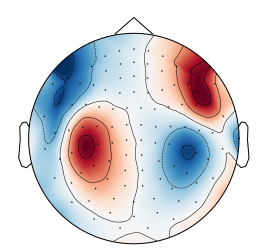

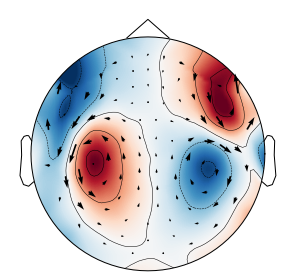

In [54]:
max_time_idx = np.abs(evoked_mag.data).mean(axis=0).argmax()
plot_arrowmap(evoked_mag.data[:, max_time_idx], evoked_mag.info)

In [14]:
from NeuroPy import NeuroPy

SyntaxError: Missing parentheses in call to 'print'. Did you mean print("Mindwave has already started!")? (NeuroPy.py, line 119)